In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_masks.npy')

In [3]:
images.shape

(11990, 512, 512, 1)

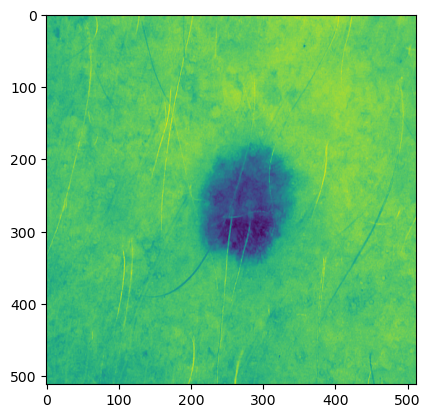

In [4]:
imshow(images[1001])

In [5]:
masks.shape

(11990, 512, 512, 1)

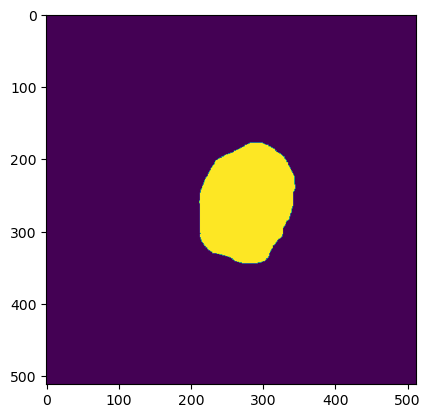

In [6]:
imshow(masks[1001])

In [7]:
import sys
sys.path.append('../')
import gp2

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpa6xnmdn7kuc_unet2d


In [11]:
hist = C.train(images[0:1000], masks[0:1000], images[1000:1500], masks[1000:1500], batch_size=16, patience_counter=4)

Epoch 1/100
63/63 [==============================] - 35s 389ms/step - loss: 0.5637 - dice_coeff: 0.3271 - val_loss: 0.4623 - val_dice_coeff: 0.4145
Epoch 2/100
63/63 [==============================] - 18s 288ms/step - loss: 0.4299 - dice_coeff: 0.4953 - val_loss: 0.4143 - val_dice_coeff: 0.5168
Epoch 3/100
63/63 [==============================] - 18s 287ms/step - loss: 0.4222 - dice_coeff: 0.5304 - val_loss: 0.4421 - val_dice_coeff: 0.4515
Epoch 4/100
63/63 [==============================] - 18s 287ms/step - loss: 0.4216 - dice_coeff: 0.5150 - val_loss: 0.4600 - val_dice_coeff: 0.4798
Epoch 5/100
63/63 [==============================] - 18s 287ms/step - loss: 0.4090 - dice_coeff: 0.5367 - val_loss: 0.4186 - val_dice_coeff: 0.5407
Epoch 6/100
63/63 [==============================] - 18s 287ms/step - loss: 0.4026 - dice_coeff: 0.5486 - val_loss: 0.4261 - val_dice_coeff: 0.5154
Epoch 7/100
63/63 [==============================] - 18s 288ms/step - loss: 0.4103 - dice_coeff: 0.5407 - val_lo

In [12]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

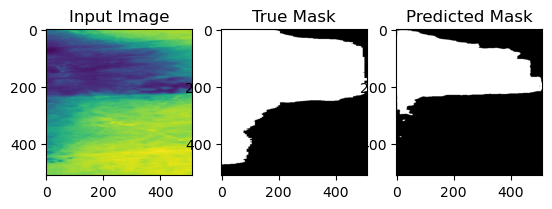

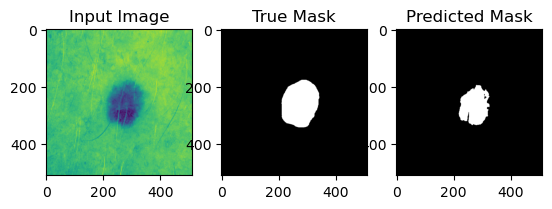

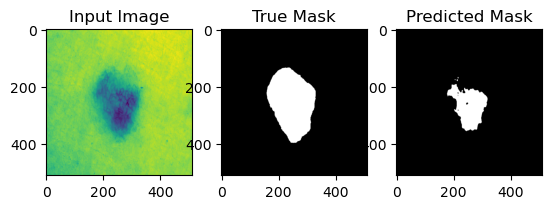

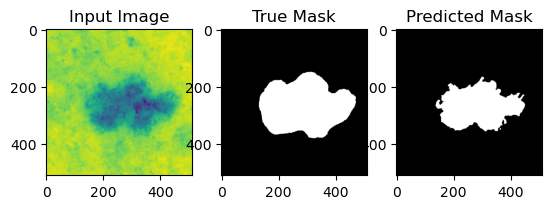

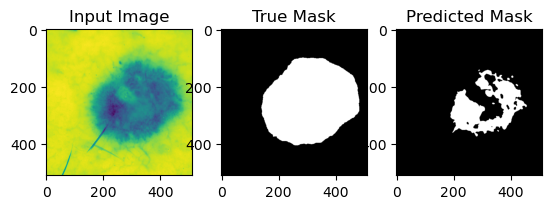

...

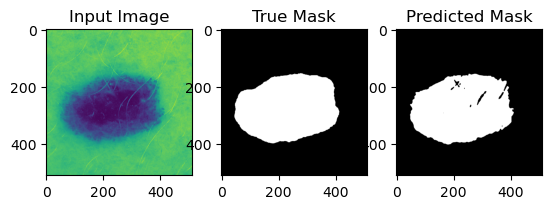

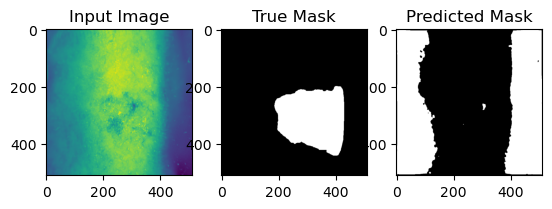

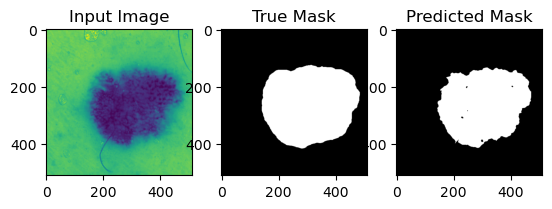

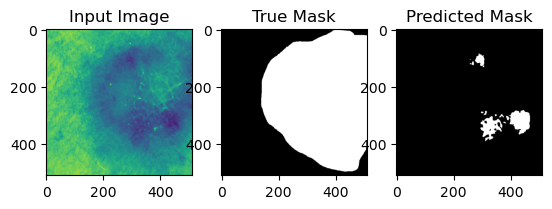

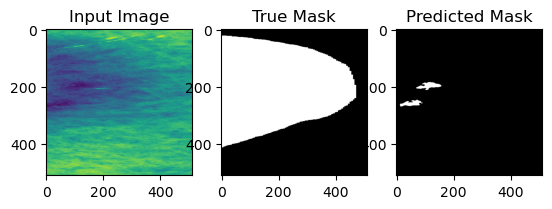

In [13]:
visualize_predictions(C, images[1000:1500], masks[1000:1500], num_samples=200)